<b><h1><center>B7+B7</center></h1></b>

In [1]:
!pip install -q efficientnet

In [2]:
import cv2
import os
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import math
import random

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import *
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import *
from tensorflow.keras.callbacks import *

from efficientnet.tfkeras import *
print('Using Tensorflow version:', tf.__version__)

Using Tensorflow version: 2.2.0


In [3]:
INIT_LR = 5e-4
EPOCHS = 32
BS = 16
tta_times = 10
imgSize = 768

# SHOW ORIGINAL IMAGES

In [4]:
def show_original_img(category):
    
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(24, 10))
    
    train_path = '../input/covid19-radiography-database/COVID-19 Radiography Database/'
    ten_random_samples = pd.Series(os.listdir(os.path.join(train_path, category))).sample(10).values
    
    for idx, image in enumerate(ten_random_samples):
        final_path = os.path.join(train_path, category, image)
        img = cv2.imread(final_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes.ravel()[idx].imshow(img)
        axes.ravel()[idx].axis('off')
    plt.tight_layout()

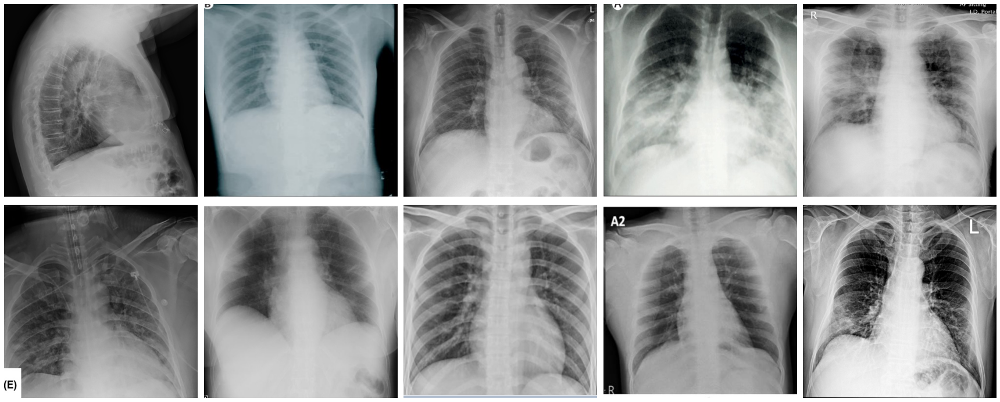

In [5]:
show_original_img('COVID-19')

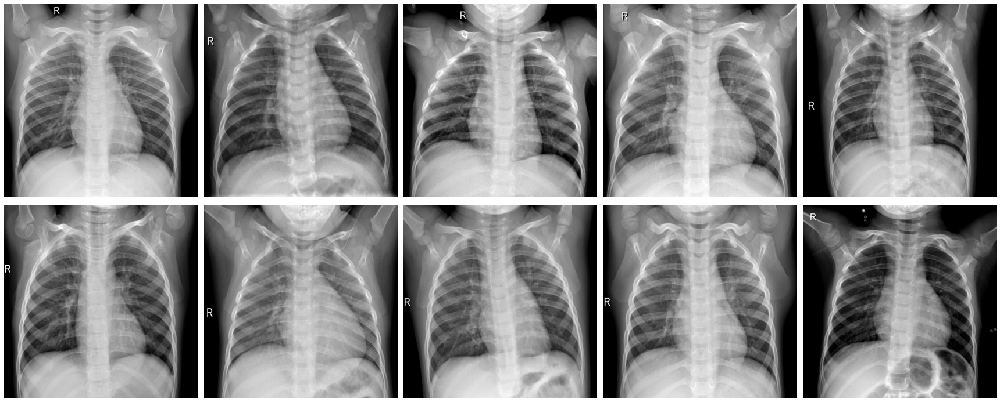

In [6]:
show_original_img('NORMAL')

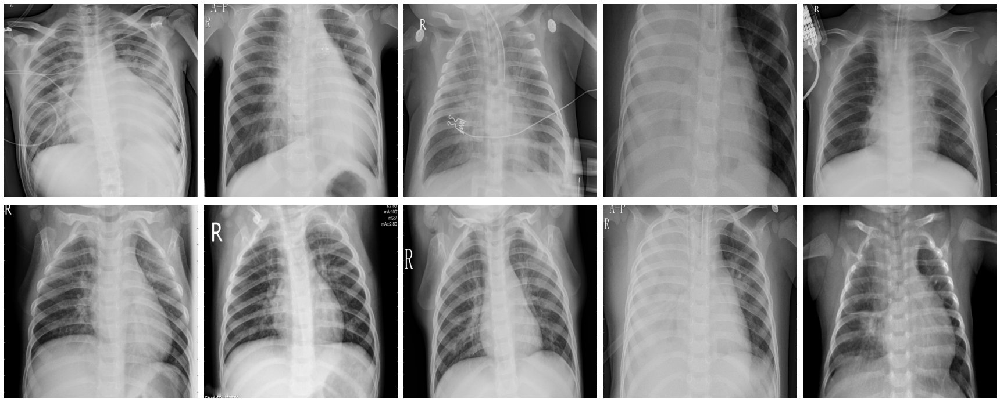

In [7]:
show_original_img('Viral Pneumonia')

We can see that images in the "NORMAL" and "Viral pneumonia" folders always have the letter 'R', raise up both hands and include the lower jawbone.

# IMAGE PREPROCESSING

In [8]:
imagePaths = []
for dirname, _, filenames in os.walk('/kaggle/input/covid19-radiography-database/COVID-19 Radiography Database/'):
    for filename in filenames:
        if (filename[-3:] == 'png'):
            imagePaths.append(os.path.join(dirname, filename))

In [9]:
os.makedirs('dataset/COVID-19')
os.makedirs('dataset/NORMAL')
os.makedirs('dataset/Viral Pneumonia')

In [10]:
for imagePath in tqdm(imagePaths):
    image = cv2.imread(imagePath)
    image = image[(1024-imgSize)//2:1024-(1024-imgSize)//2, (1024-imgSize)//2:1024-(1024-imgSize)//2]
    cv2.imwrite('dataset/'+'/'.join(imagePath.split(os.path.sep)[-2:]), image)

100%|██████████| 2905/2905 [02:11<00:00, 22.07it/s]


# SHOW CROPPED IMAGES

In [11]:
def show_cropped_img(category):
    
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(24, 10))
    
    train_path = 'dataset/'
    ten_random_samples = pd.Series(os.listdir(os.path.join(train_path, category))).sample(10).values
    
    for idx, image in enumerate(ten_random_samples):
        final_path = os.path.join(train_path, category, image)
        img = cv2.imread(final_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes.ravel()[idx].imshow(img)
        axes.ravel()[idx].axis('off')
    plt.tight_layout()

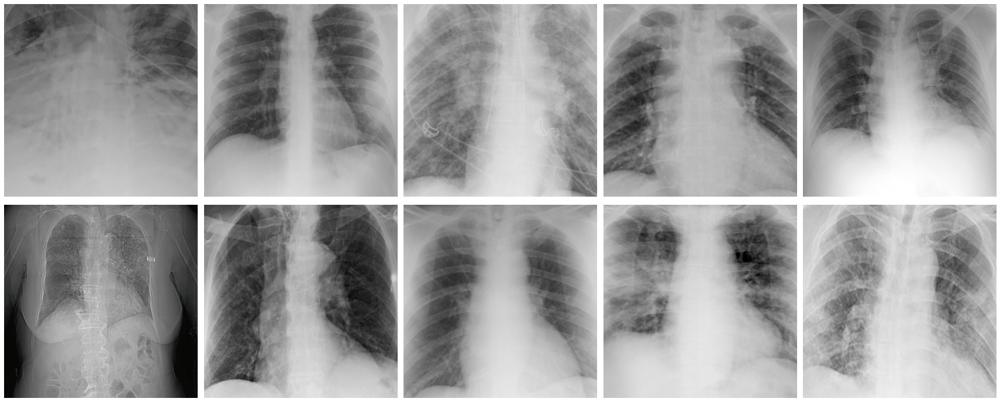

In [12]:
show_cropped_img('COVID-19')

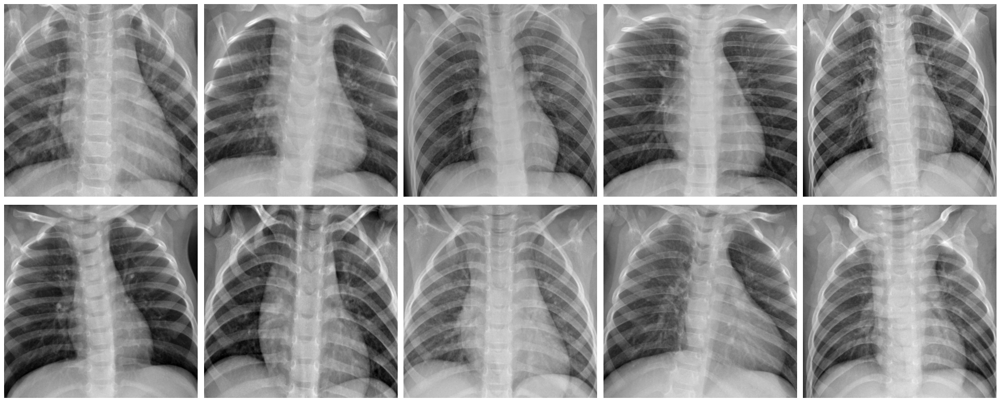

In [13]:
show_cropped_img('NORMAL')

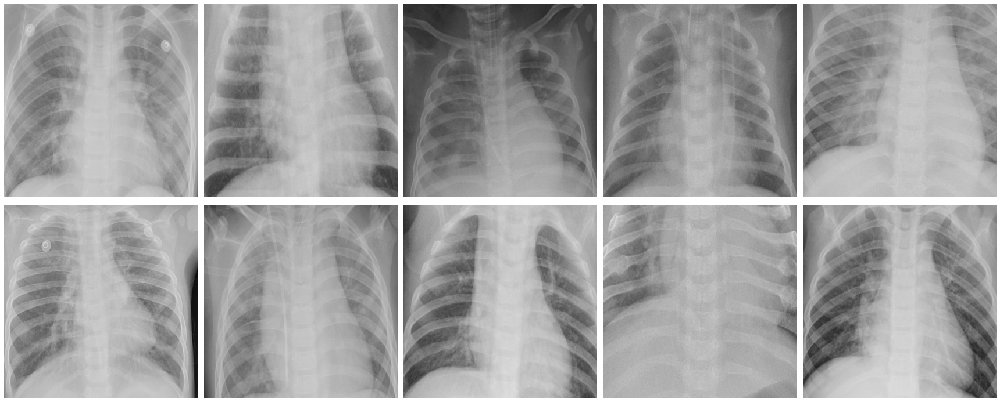

In [14]:
show_cropped_img('Viral Pneumonia')

# LOAD

In [15]:
def change_brightness(img):
    value = random.randint(-10,10)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    
    v = cv2.add(v,value)
    v[v > 255] = 255
    v[v < 0] = 0
    
    final_hsv = cv2.merge((h, s, v))
    img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
    return img

def preprocessing(img):
    img = change_brightness(img)
    return img

In [16]:
trainAug = ImageDataGenerator(rotation_range=20, 
                              horizontal_flip = True,
                              shear_range=0.1,
                              zoom_range=0.1,
                              channel_shift_range = 0.05,
                              fill_mode="nearest", 
                              rescale=1./255,
                              preprocessing_function = preprocessing,
                              validation_split=0.2)
testAug = ImageDataGenerator(rescale=1./255,
                             validation_split=0.2)

In [17]:
train_generator = trainAug.flow_from_directory('dataset/',
                                               target_size=(imgSize, imgSize),
                                               batch_size=BS,
                                               class_mode='categorical', 
                                               subset='training')

Found 2325 images belonging to 3 classes.


In [18]:
test_generator = testAug.flow_from_directory('dataset/',
                                              target_size=(imgSize, imgSize),
                                              batch_size=BS,
                                              class_mode='categorical', 
                                              subset='validation')

Found 580 images belonging to 3 classes.


# MODEL

In [19]:
def outer_product(x):
    #Einstein Notation  [batch,1,1,depth] x [batch,1,1,depth] -> [batch,depth,depth]
    phi_I = tf.einsum('ijkm,ijkn->imn', x[0], x[1])
    
    # Reshape from [batch_size,depth,depth] to [batch_size, depth*depth]
    phi_I = tf.reshape(phi_I,[-1,x[0].shape[3]*x[1].shape[3]])
    
    # Divide by feature map size [sizexsize]
    size1 = int(x[1].shape[1])
    size2 = int(x[1].shape[2])
    phi_I = tf.divide(phi_I, size1*size2)
    
    # Take signed square root of phi_I
    y_ssqrt = tf.multiply(tf.sign(phi_I),tf.sqrt(tf.abs(phi_I)+1e-12))
    
    # Apply l2 normalization
    z_l2 = tf.nn.l2_normalize(y_ssqrt, axis=1)
    return z_l2

def build_model():
    input_tensor = Input(shape=(imgSize, imgSize, 3))
    opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
    
    model1 = EfficientNetB7(weights='imagenet', include_top=False, input_tensor=input_tensor,input_shape=(imgSize, imgSize, 3))
    model2 = EfficientNetB7(weights='noisy-student', include_top=False, input_tensor=input_tensor,input_shape=(imgSize, imgSize, 3))    
    
    for layer in model1.layers:
        layer._name = 'model1_' + layer.name

    last_layer1 = model1.get_layer('model1_top_conv')
    last_output1 = last_layer1.output

    for layer in model2.layers:
        layer._name = 'model2_' + layer.name

    last_layer2 = model2.get_layer('model2_top_conv')
    last_output2 = last_layer2.output
    
    
    model1_ = Model(inputs=model1.input, outputs=last_output1)
    model2_ = Model(inputs=model2.input, outputs=last_output2)
    
    model1_.trainable = False
    model2_.trainable = False
    
    model1_.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])
    model2_.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])
    
    d1 = model1_.output
    d2 = model2_.output

    bilinear = Lambda(outer_product, name='outer_product1')([d1,d2])
    
    predictions=Dense(3, activation='softmax', name='predictions')(bilinear)
    model = Model(inputs=model1.input, outputs=predictions)

    return model

In [20]:
model = build_model()
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

258072576/258068648 [==============================] - 11s 0us/step


In [21]:
best_val_acc = 0
best_val_loss = 0
def saveModel(epoch,logs):
    val_acc = logs['val_accuracy']
    val_loss = logs['val_loss']
    global best_val_acc
    global best_val_loss

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_val_loss = val_loss
        model.save('model.h5')
    elif val_acc == best_val_acc:
        if val_loss > best_val_loss:
            best_val_loss= val_loss
            model.save('model.h5')

In [22]:
H = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BS,
    validation_data=test_generator,
    validation_steps=test_generator.samples // BS,
    callbacks= [LambdaCallback(on_epoch_end=saveModel),
#              EarlyStopping(monitor='val_accuracy', patience=3),
#              ReduceLROnPlateau(monitor='val_accuracy', factor=0.5,patience=2),
              ],
    epochs=EPOCHS)

Epoch 1/32
145/145 [==============================] - 685s 5s/step - loss: 0.5957 - accuracy: 0.7518 - val_loss: 0.2486 - val_accuracy: 0.9271
Epoch 2/32
145/145 [==============================] - 661s 5s/step - loss: 0.4201 - accuracy: 0.8393 - val_loss: 0.2018 - val_accuracy: 0.9340
Epoch 3/32
145/145 [==============================] - 654s 5s/step - loss: 0.3754 - accuracy: 0.8605 - val_loss: 0.4053 - val_accuracy: 0.8177
Epoch 4/32
145/145 [==============================] - 660s 5s/step - loss: 0.3543 - accuracy: 0.8666 - val_loss: 0.1902 - val_accuracy: 0.9375
Epoch 5/32
145/145 [==============================] - 654s 5s/step - loss: 0.3214 - accuracy: 0.8822 - val_loss: 0.1848 - val_accuracy: 0.9340
Epoch 6/32
145/145 [==============================] - 680s 5s/step - loss: 0.3292 - accuracy: 0.8792 - val_loss: 0.3560 - val_accuracy: 0.8351
Epoch 7/32
145/145 [==============================] - 692s 5s/step - loss: 0.3064 - accuracy: 0.8865 - val_loss: 0.1912 - val_accuracy: 0.9427

# PLOT

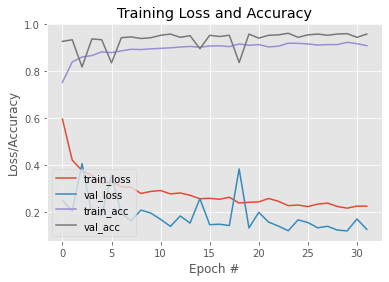

In [23]:
N = EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")

# TEST WITH TTA

In [24]:
def wrong_to_list(preds, generator):
    res = []
    for i in range(len(preds)):
        if (preds[i] != generator.labels[i]):
            res.append(generator.filenames[i])
    return res

def show_wrong_img(l):
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(24, 10))
    ten_random_samples = pd.Series(l).sample(10).values
    
    for idx, image in enumerate(ten_random_samples):
        final_path = os.path.join('dataset/', image)
        img = cv2.imread(final_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes.ravel()[idx].imshow(img)
        axes.ravel()[idx].axis('off')
    plt.tight_layout()

## ON TRAIN

In [25]:
train = ImageDataGenerator(rescale=1./255,
                           validation_split=0.2).flow_from_directory('dataset/',
                                                                     target_size=(imgSize, imgSize),
                                                                     batch_size=BS,
                                                                     class_mode='categorical',
                                                                     shuffle = False,
                                                                     subset='training')

Found 2325 images belonging to 3 classes.


In [26]:
CName = {v: k for k, v in train.class_indices.items()}
predIdxs = model.predict_generator(train)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(train.labels, predIdxs, target_names=list(train.class_indices.keys()), digits = 5))

                 precision    recall  f1-score   support

       COVID-19    0.99379   0.90909   0.94955       176
         NORMAL    0.93434   0.98136   0.95727      1073
Viral Pneumonia    0.96721   0.93216   0.94936      1076

       accuracy                        0.95312      2325
      macro avg    0.96511   0.94087   0.95206      2325
   weighted avg    0.95405   0.95312   0.95303      2325



In [27]:
for i in range(len(predIdxs)):
    if (predIdxs[i] != train.labels[i]):
        print('Filename:',train.filenames[i].split('/')[1], '\t'*(5-math.ceil((len(train.filenames[i].split('/')[1])+3)/8)) +'PRED:', CName[predIdxs[i]])

Filename: COVID-19 (25).png 		PRED: NORMAL
Filename: COVID-19 (26).png 		PRED: Viral Pneumonia
Filename: COVID-19 (30).png 		PRED: Viral Pneumonia
Filename: COVID-19 (59).png 		PRED: Viral Pneumonia
Filename: COVID-19 (61).png 		PRED: Viral Pneumonia
Filename: COVID-19 (63).png 		PRED: Viral Pneumonia
Filename: COVID-19 (71).png 		PRED: Viral Pneumonia
Filename: COVID-19(143).png 		PRED: Viral Pneumonia
Filename: COVID-19(144).png 		PRED: Viral Pneumonia
Filename: COVID-19(145).png 		PRED: Viral Pneumonia
Filename: COVID-19(187).png 		PRED: Viral Pneumonia
Filename: COVID-19(191).png 		PRED: Viral Pneumonia
Filename: COVID-19(193).png 		PRED: Viral Pneumonia
Filename: COVID-19(194).png 		PRED: NORMAL
Filename: COVID-19(195).png 		PRED: Viral Pneumonia
Filename: COVID-19(196).png 		PRED: Viral Pneumonia
Filename: NORMAL (1325).png 		PRED: Viral Pneumonia
Filename: NORMAL (1326).png 		PRED: Viral Pneumonia
Filename: NORMAL (1332).png 		PRED: Viral Pneumonia
Filename: NORMAL (1335).png 		

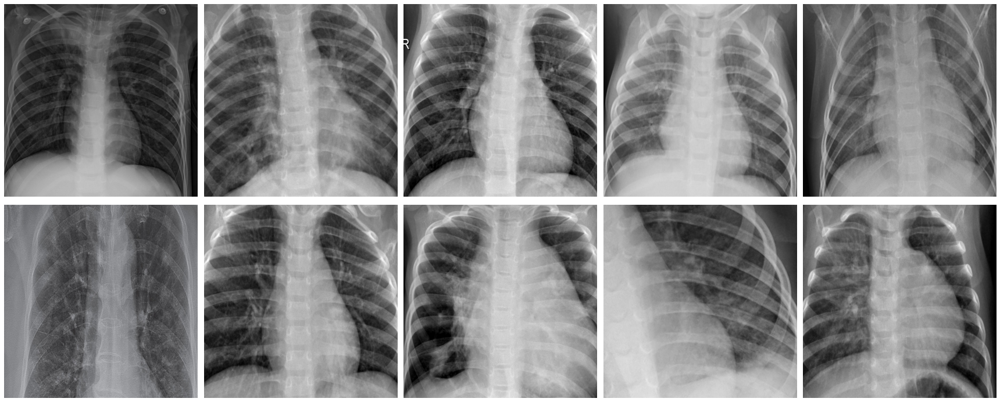

In [28]:
show_wrong_img(wrong_to_list(predIdxs, train))

## ON TEST

In [29]:
test = ImageDataGenerator(rescale=1./255, 
                          validation_split=0.2).flow_from_directory('dataset/',
                                                                    target_size=(imgSize, imgSize),
                                                                    batch_size=BS,
                                                                    class_mode='categorical', 
                                                                    shuffle = False, 
                                                                    subset='validation')

Found 580 images belonging to 3 classes.


In [30]:
CName = {v: k for k, v in test.class_indices.items()}
predIdxs = model.predict_generator(test, verbose=1)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(test.labels, predIdxs, target_names=list(test.class_indices.keys()), digits = 5))

37/37 [==============================] - 90s 2s/step
                 precision    recall  f1-score   support

       COVID-19    1.00000   0.97674   0.98824        43
         NORMAL    0.94224   0.97388   0.95780       268
Viral Pneumonia    0.96935   0.94052   0.95472       269

       accuracy                        0.95862       580
      macro avg    0.97053   0.96372   0.96692       580
   weighted avg    0.95909   0.95862   0.95863       580



In [31]:
for i in range(len(predIdxs)):
    if (predIdxs[i] != test.labels[i]):
        print('Filename:',test.filenames[i].split('/')[1], '\t'*(5-math.ceil((len(test.filenames[i].split('/')[1])+3)/8)) +'PRED:', CName[predIdxs[i]])

Filename: COVID-19 (1).png 		PRED: Viral Pneumonia
Filename: NORMAL (1088).png 		PRED: Viral Pneumonia
Filename: NORMAL (1089).png 		PRED: Viral Pneumonia
Filename: NORMAL (1091).png 		PRED: Viral Pneumonia
Filename: NORMAL (1092).png 		PRED: Viral Pneumonia
Filename: NORMAL (1206).png 		PRED: Viral Pneumonia
Filename: NORMAL (1230).png 		PRED: Viral Pneumonia
Filename: NORMAL (1235).png 		PRED: Viral Pneumonia
Filename: Viral Pneumonia (1002).png 	PRED: NORMAL
Filename: Viral Pneumonia (1003).png 	PRED: NORMAL
Filename: Viral Pneumonia (1019).png 	PRED: NORMAL
Filename: Viral Pneumonia (1023).png 	PRED: NORMAL
Filename: Viral Pneumonia (1067).png 	PRED: NORMAL
Filename: Viral Pneumonia (1072).png 	PRED: NORMAL
Filename: Viral Pneumonia (1120).png 	PRED: NORMAL
Filename: Viral Pneumonia (1124).png 	PRED: NORMAL
Filename: Viral Pneumonia (1138).png 	PRED: NORMAL
Filename: Viral Pneumonia (1141).png 	PRED: NORMAL
Filename: Viral Pneumonia (1221).png 	PRED: NORMAL
Filename: Viral Pneumoni

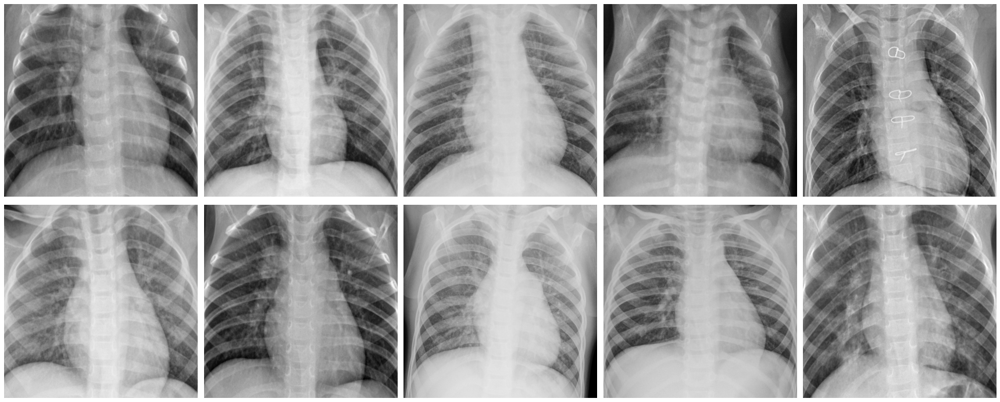

In [32]:
show_wrong_img(wrong_to_list(predIdxs, test))

# TEST WITH TTA

## ON TRAIN

In [33]:
train = ImageDataGenerator(rotation_range=5, 
                          horizontal_flip = True,
                          shear_range=0.05,
                          zoom_range=0.05,
                          channel_shift_range = 0.025,
                          fill_mode="nearest", 
                          rescale=1./255,
                          preprocessing_function = preprocessing,
                          validation_split=0.2).flow_from_directory('dataset/',
                                                                     target_size=(imgSize, imgSize),
                                                                     batch_size=BS,
                                                                     class_mode='categorical',
                                                                     shuffle = False,
                                                                     subset='training')
CName = {v: k for k, v in train.class_indices.items()}
probabilities = []
for i in range(tta_times+1):
    print('TTA Number: ', i, '\n')
    probabilities.append(model.predict(train, verbose=1))
predIdxs = np.mean(probabilities, axis=0)
predIdxs = np.argmax(predIdxs, axis=1)

Found 2325 images belonging to 3 classes.
TTA Number:  0 

146/146 [==============================] - 586s 4s/step
TTA Number:  1 

146/146 [==============================] - 580s 4s/step
TTA Number:  2 

146/146 [==============================] - 578s 4s/step
TTA Number:  3 

146/146 [==============================] - 581s 4s/step
TTA Number:  4 

146/146 [==============================] - 577s 4s/step
TTA Number:  5 

146/146 [==============================] - 551s 4s/step
TTA Number:  6 

146/146 [==============================] - 543s 4s/step
TTA Number:  7 

146/146 [==============================] - 540s 4s/step
TTA Number:  8 

146/146 [==============================] - 539s 4s/step
TTA Number:  9 

146/146 [==============================] - 539s 4s/step
TTA Number:  10 

146/146 [==============================] - 536s 4s/step


In [34]:
print(classification_report(train.labels, predIdxs, target_names=list(train.class_indices.keys()), digits = 5))

                 precision    recall  f1-score   support

       COVID-19    0.96571   0.96023   0.96296       176
         NORMAL    0.94526   0.96552   0.95528      1073
Viral Pneumonia    0.96205   0.94238   0.95211      1076

       accuracy                        0.95441      2325
      macro avg    0.95767   0.95604   0.95678      2325
   weighted avg    0.95458   0.95441   0.95440      2325



In [35]:
for i in range(len(predIdxs)):
    if (predIdxs[i] != train.labels[i]):
        print('Filename:',train.filenames[i].split('/')[1], '\t'*(5-math.ceil((len(train.filenames[i].split('/')[1])+3)/8)) +'PRED:', CName[predIdxs[i]])

Filename: COVID-19 (63).png 		PRED: Viral Pneumonia
Filename: COVID-19 (71).png 		PRED: Viral Pneumonia
Filename: COVID-19(191).png 		PRED: Viral Pneumonia
Filename: COVID-19(193).png 		PRED: Viral Pneumonia
Filename: COVID-19(194).png 		PRED: NORMAL
Filename: COVID-19(195).png 		PRED: Viral Pneumonia
Filename: COVID-19(196).png 		PRED: Viral Pneumonia
Filename: NORMAL (1325).png 		PRED: Viral Pneumonia
Filename: NORMAL (1326).png 		PRED: Viral Pneumonia
Filename: NORMAL (1331).png 		PRED: Viral Pneumonia
Filename: NORMAL (1332).png 		PRED: Viral Pneumonia
Filename: NORMAL (1334).png 		PRED: Viral Pneumonia
Filename: NORMAL (1335).png 		PRED: Viral Pneumonia
Filename: NORMAL (1336).png 		PRED: Viral Pneumonia
Filename: NORMAL (1337).png 		PRED: Viral Pneumonia
Filename: NORMAL (1338).png 		PRED: Viral Pneumonia
Filename: NORMAL (1339).png 		PRED: Viral Pneumonia
Filename: NORMAL (23).png 		PRED: Viral Pneumonia
Filename: NORMAL (288).png 		PRED: Viral Pneumonia
Filename: NORMAL (321).p

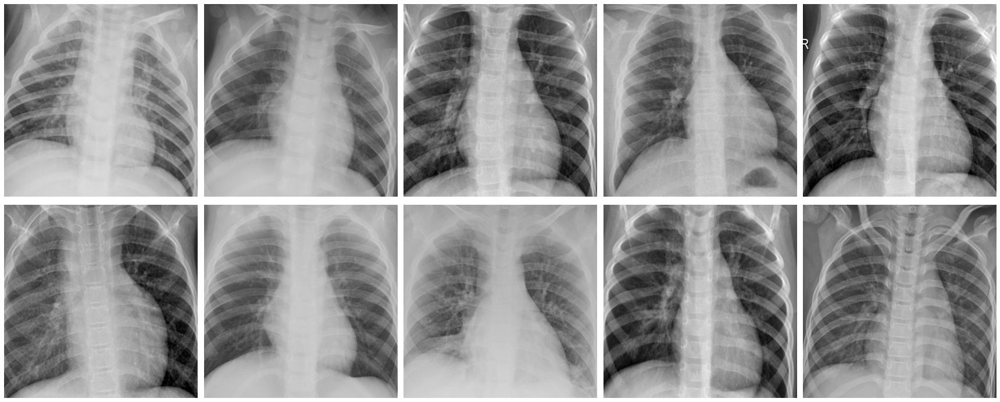

In [36]:
show_wrong_img(wrong_to_list(predIdxs, train))

## ON TEST

In [37]:
test = ImageDataGenerator(rotation_range=5, 
                          horizontal_flip = True,
                          shear_range=0.05,
                          zoom_range=0.05,
                          channel_shift_range = 0.025,
                          fill_mode="nearest", 
                          rescale=1./255,
                          preprocessing_function = preprocessing,
                          validation_split=0.2).flow_from_directory('dataset/',
                                                                    target_size=(imgSize, imgSize),
                                                                    batch_size=BS,
                                                                    class_mode='categorical', 
                                                                    shuffle = False, 
                                                                    subset='validation')
CName = {v: k for k, v in test.class_indices.items()}
probabilities = []
for i in range(tta_times+1):
    print('TTA Number: ', i, '\n')
    probabilities.append(model.predict(test, verbose=1))
predIdxs = np.mean(probabilities, axis=0)
predIdxs = np.argmax(predIdxs, axis=1)

Found 580 images belonging to 3 classes.
TTA Number:  0 

37/37 [==============================] - 132s 4s/step
TTA Number:  1 

37/37 [==============================] - 131s 4s/step
TTA Number:  2 

37/37 [==============================] - 131s 4s/step
TTA Number:  3 

37/37 [==============================] - 130s 4s/step
TTA Number:  4 

37/37 [==============================] - 134s 4s/step
TTA Number:  5 

37/37 [==============================] - 136s 4s/step
TTA Number:  6 

37/37 [==============================] - 134s 4s/step
TTA Number:  7 

37/37 [==============================] - 132s 4s/step
TTA Number:  8 

37/37 [==============================] - 133s 4s/step
TTA Number:  9 

37/37 [==============================] - 131s 4s/step
TTA Number:  10 

37/37 [==============================] - 132s 4s/step


In [38]:
print(classification_report(test.labels, predIdxs, target_names=list(test.class_indices.keys()), digits = 5))

                 precision    recall  f1-score   support

       COVID-19    0.97727   1.00000   0.98851        43
         NORMAL    0.95588   0.97015   0.96296       268
Viral Pneumonia    0.97348   0.95539   0.96435       269

       accuracy                        0.96552       580
      macro avg    0.96888   0.97518   0.97194       580
   weighted avg    0.96563   0.96552   0.96550       580



In [39]:
for i in range(len(predIdxs)):
    if (predIdxs[i] != test.labels[i]):
        print('Filename:',test.filenames[i].split('/')[1], '\t'*(5-math.ceil((len(test.filenames[i].split('/')[1])+3)/8)) +'PRED:', CName[predIdxs[i]], '\t'*(4-(3+len(CName[predIdxs[i]]))//8) + 'TRUE:', CName[test.labels[i]])

Filename: NORMAL (1088).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: NORMAL (1089).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: NORMAL (1091).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: NORMAL (1092).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: NORMAL (1093).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: NORMAL (1206).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: NORMAL (1230).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: NORMAL (1235).png 		PRED: COVID-19 			TRUE: NORMAL
Filename: Viral Pneumonia (1002).png 	PRED: NORMAL 			TRUE: Viral Pneumonia
Filename: Viral Pneumonia (1003).png 	PRED: NORMAL 			TRUE: Viral Pneumonia
Filename: Viral Pneumonia (1023).png 	PRED: NORMAL 			TRUE: Viral Pneumonia
Filename: Viral Pneumonia (1120).png 	PRED: NORMAL 			TRUE: Viral Pneumonia
Filename: Viral Pneumonia (1124).png 	PRED: NORMAL 			TRUE: Viral Pneumonia
Filename: Viral Pneumonia (1138).png 	PRED: NORMAL 			TRUE: Viral Pneumonia
Filename: Vira

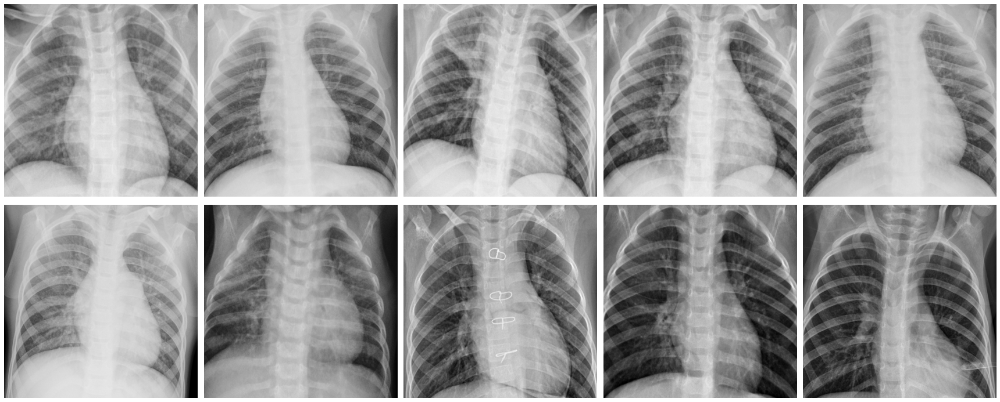

In [40]:
show_wrong_img(wrong_to_list(predIdxs, test))